# Démonstration de la création des features de MOSAIKS

> **IMPORTANT :** Si vous souhaitez exécuter ce code dans Google Colab, vous devez sélectionner l'environnement d'exécution **GPU** en allant dans « Exécution » -> « Modifier le type d'environnement d'exécution » et en sélectionnant « GPU ». Bien que cela ne soit pas strictement nécessaire, cela améliore considérablement la vitesse de traitement !

> **Remarque** : Si vous souhaitez enregistrer ce notebook avec vos modifications, assurez-vous de cliquer sur ``Fichier`` -> ``Enregistrer une copie dans Drive``. Toutes les modifications seront perdues si vous fermez cet onglet sans enregistrer une copie dans votre Google Drive. Toutes les modifications effectuées avant d'enregistrer une copie dans Drive seront enregistrées dans le notebook après avoir enregistré une copie dans Drive. Les données sont téléchargées depuis Internet et stockées sur le disque temporaire de l'environnement. Ces données seront supprimées une fois la session terminée.

Cette démonstration vous montrera quelques concepts clés sur la transformation des données satellite en fonctionnalités MOSAIKS. Le notebook vous guidera tout au long du processus de transformation, notamment :

1. Téléchargement d'images satellite en masse

1. Définir un ensemble de données PyTorch

1. Définir un DataLoader PyTorch

1. Construire un modèle d'extraction de features convolutionnelles aléatoires

1. Mettez en valeur les images

1. Enregistrez les fonctionnalités sur le disque

Ce cahier ne couvrira pas le processus de modélisation des tâches. La modélisation des tâches sera abordée dans les chapitres ultérieurs du manuel de formation et dans les cahiers de démonstration qui lui sont consacrés.

## Configuration de l'environnement

### Installer les packages requis

Google Colab est un environnement Jupyter notebook gratuit qui ne nécessite aucune configuration et fonctionne entièrement dans le cloud. Il est livré préinstallé avec de nombreux packages, y compris la plupart de ceux dont nous avons besoin pour ce notebook. Il y a quelques packages supplémentaires que nous devons installer, ce que nous ferons dans la cellule suivante.

## Installation

Installez ``rasterio`` pour le traitement des images satellite, puis chargez les bibliothèques nécessaires au traitement des images.

In [ ]:
%pip install rasterio
%pip install torchgeo

In [2]:
# Il faut mettre la variable ON_COLAB à True si vous exécuter le notebook en local
ON_COLAB = False

In [ ]:
import os
import time
import torch
import shutil
import requests
from zipfile import ZipFile
import rasterio
import numpy as np
import pandas as pd

import torch.nn as nn
import requests
import matplotlib.pyplot as plt
from PIL import Image
from io import BytesIO
import torchvision.transforms as transforms
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches

from scipy.signal import convolve2d

# from google.colab import drive

from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader
from typing import Dict, List, Tuple, Union, Callable, Any, Optional

## Modèle d'extracteur RCF de base

Avant de commencer et de traiter les images, essayons de comprendre un modèle d'extracteur de features convolutionnelles aléatoires (RCF) de base.

Nous définissons d'abord le modèle ``Pytorch`` que nous utiliserons pour extraire les features et une méthode d'aide. La méthodologie MOSAIKS décrit plusieurs façons de procéder et nous allons d'abord démontrer la méthode la plus simple. Dans la méthode la plus simple, nous générerons des poids pour le modèle en tirant des échantillons aléatoires d'une distribution normale avec une moyenne de 0 et un écart type de 1.

In [2]:
# import torch
# import torch.nn as nn
# import torch.nn.functional as F


class RCF(nn.Module):
    """A model for extracting Random Convolution Features (RCF) from input imagery."""

    def __init__(self, num_features=16, kernel_size=3, num_input_channels=3, bias=-1.0):
        super(RCF, self).__init__()

        # We create `num_features / 2` filters so require `num_features` to be divisible by 2
        assert num_features % 2 == 0

        self.conv1 = nn.Conv2d(
            num_input_channels,
            num_features // 2,
            kernel_size=kernel_size,
            stride=1,
            padding=0,
            dilation=1,
            bias=True,
        )

        nn.init.normal_(self.conv1.weight, mean=0.0, std=1.0)
        nn.init.constant_(self.conv1.bias, bias)

    def forward(self, x):
        # Two for one activation
        x1a = F.relu(self.conv1(x), inplace=True)
        x1b = F.relu(-self.conv1(x), inplace=True)

        x1a = F.adaptive_avg_pool2d(x1a, (1, 1)).squeeze()
        x1b = F.adaptive_avg_pool2d(x1b, (1, 1)).squeeze()

        if len(x1a.shape) == 1:  # case where we passed a single input
            return torch.cat((x1a, x1b), dim=0)
        elif len(x1a.shape) == 2:  # case where we passed a batch of > 1 inputs
            return torch.cat((x1a, x1b), dim=1)

### Comprendre le code

Le modèle « RCF » est un réseau neuronal PyTorch simple conçu pour extraire les RCF des données d'imagerie. Voici un aperçu de ses composants et de son comportement :

1. Initialisation :

    - Paramètres d'entrée :

        - `num_features` : nombre total de fonctionnalités en sortie, qui doit être un nombre pair.
        - `kernel_size` : la taille du noyau convolutif.
        - `num_input_channels` : le nombre de canaux dans l'image d'entrée.
        - `bias` : un terme de biais à ajouter à la sortie convolutive.

    - Configuration des couches :

        - Une seule couche convolutionnelle (`conv1`) est créée. Cette couche prend l'image d'entrée (avec num_input_channels) et produit num_features/2 canaux de sortie.
        - Les paramètres du noyau incluent une ``stride`` de 1, pas de `padding`, une ``dilatation`` de 1 et un terme de ``biais``.

    - Initialisation des poids :

        - Les poids de la couche convolutionnelle sont initialisés à l'aide d'une distribution normale avec une moyenne de 0,0 et un écart type de 1.
        - Le « biais » est initialisé à une valeur constante de -1.

2. Passe avant :

    - L'image d'entrée est traitée deux fois via la même couche convolutive :

        - Tout d’abord, la sortie de convolution est passée via une activation ReLU pour obtenir `x1a`.
        - Deuxièmement, le négatif de la sortie de convolution est passé via une activation ReLU pour obtenir `x1b`.
        - Cela capture efficacement les fonctionnalités qui pourraient être supprimées dans un passage ReLU standard.

    - Les valeurs ``x1a`` et ``x1b`` sont ensuite moyennées en utilisant un *average pooling*.

        - Cela réduit chaque carte de features à une valeur unique (quelles que soient les dimensions spatiales d'origine).
        - Cette opération génère des formes de tenseurs qui sont soit 1D (pour une seule image) soit 2D (pour un lot d'images).

    - Enfin, les deux résultats (`x1a` et `x1b`) sont concaténés :

        - Pour une seule image d'entrée (résultant en tenseurs 1D), ils sont concaténés le long de la 0ème dimension.
        - Pour un lot d'images (donnant lieu à des tenseurs 2D), celles-ci sont concaténées selon la dimension caractéristique (1ère dimension).

3. Comportement général :

    - Le modèle est léger et applique une seule convolution aléatoire (avec des poids et des biais randomisés) pour extraire des features doubles des données d'entrée (réponses de features positives et négatives).

    - L'utilisation d'un pooling moyen adaptatif garantit que la sortie est invariante par rapport à la taille de l'entrée, ce qui la rend particulièrement flexible lors du traitement d'images de dimensions spatiales variables.

## Ajouter un échantillonnage empirique

L'étape suivante consiste à ajouter un échantillonnage empirique. Il s'agit d'une méthode plus avancée de génération de pondérations pour le modèle, dans laquelle nous échantillonnons des patchs à partir des données d'entrée et les utilisons comme pondérations pour le modèle.

In [3]:
from scipy.signal import convolve2d


def sharpen_image(image: np.ndarray) -> np.ndarray:
    # Define sharpening kernel
    kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

    # Apply kernel to each band if the image has more than 2 dimensions.
    if len(image.shape) == 3:
        sharpened = np.zeros_like(image)
        for i in range(image.shape[2]):
            sharpened[:, :, i] = convolve2d(
                image[:, :, i], kernel, mode="same", boundary="symm"
            )
    else:
        sharpened = convolve2d(image, kernel, mode="same", boundary="symm")

    return np.clip(sharpened, 0, 1)


class RCFWithPatchSampling(nn.Module):
    """
    A model for extracting Random Convolution Features (RCF) with patch sampling
    from the input image for empirical convolution kernels.
    """

    def __init__(
        self,
        num_features: int = 6,  # Number of features to compute (must be divisible by 2)
        kernel_size: int = 3,
        num_input_channels: int = 3,
        patch_sampling: bool = True,  # Enable empirical patch sampling
        seed: int = 42,  # Seed for reproducibility
        bias: float = -1.0,  # Bias value for the convolution layer
    ) -> None:
        super(RCFWithPatchSampling, self).__init__()
        # Set the seed for reproducibility
        torch.manual_seed(seed)

        assert num_features % 2 == 0, "num_features must be divisible by 2"
        self.num_features = num_features
        self.kernel_size = kernel_size
        self.num_input_channels = num_input_channels
        self.patch_sampling = patch_sampling
        self.seed = seed
        self.bias = bias

        # Will store coordinates (y, x) for each patch so that we can plot them later
        self.patch_coords = []
        self.unnormalized_patches = None

        if patch_sampling:
            # We register the weight and bias tensors as "buffers". This does two things:
            # makes them behave correctly when we call .to(...) on the module, and makes
            # them explicitly _not_ Parameters of the model (which might get updated) if
            # a user tries to train with this model.
            self.register_buffer(
                "weights",
                torch.zeros(
                    num_features // 2,
                    num_input_channels,
                    kernel_size,
                    kernel_size,
                    requires_grad=False,
                ),
            )
            self.register_buffer(
                "biases", torch.zeros(num_features // 2, requires_grad=False) - bias
            )
        else:
            self.conv1 = nn.Conv2d(
                num_input_channels,
                num_features // 2,
                kernel_size=kernel_size,
                stride=1,
                padding=kernel_size // 2,  # Ensure input shape is preserved
                bias=True,
            )
            nn.init.normal_(self.conv1.weight, mean=0.0, std=1.0)
            nn.init.constant_(self.conv1.bias, -1.0)

    def extract_patches(self, img_tensor: torch.Tensor) -> None:
        """
        Extract patches for empirical sampling and store their locations.

        Parameters
        ----------
        img_tensor : torch.Tensor
            The input tensor with shape [B, C, H, W]. Note: We use only the first image.
        """
        _, c, h, w = img_tensor.shape
        np.random.seed(self.seed)
        patches = np.zeros(
            (
                self.num_features // 2,
                self.num_input_channels,
                self.kernel_size,
                self.kernel_size,
            ),
            dtype=np.float32,
        )
        self.patch_coords = []  # Reset coordinates on every call

        for i in range(self.num_features // 2):
            # Ensure that the sampled patch fully fits in the image dimensions.
            y = np.random.randint(0, h - self.kernel_size + 1)
            x = np.random.randint(0, w - self.kernel_size + 1)
            self.patch_coords.append((y, x))

            # Convert the patch to NumPy float32 explicitly
            patch = (
                img_tensor[0, :, y : y + self.kernel_size, x : x + self.kernel_size]
                .detach()
                .cpu()
                .numpy()
                .astype(np.float32)
            )
            patches[i] = patch

        # Keep a copy of the unnormalized patches
        unnorm_patches = np.copy(patches)

        # Normalize them
        patches = self._normalize(patches)

        # Convert both unnormalized and normalized patches to torch Tensors
        self.unnormalized_patches = torch.tensor(unnorm_patches)
        self.weights = torch.tensor(patches)

    def _normalize(
        self,
        patches: "np.typing.NDArray[np.float32]",
        min_divisor: float = 1e-8,
        zca_bias: float = 0.001,
    ) -> "np.typing.NDArray[np.float32]":
        n_patches = patches.shape[0]
        orig_shape = patches.shape
        patches = patches.reshape(n_patches, -1)

        # Zero-mean
        patches = patches - np.mean(patches, axis=1, keepdims=True)

        # Normalize
        patch_norms = np.linalg.norm(patches, axis=1)
        patch_norms[np.where(patch_norms < min_divisor)] = 1
        patches = patches / patch_norms[:, np.newaxis]

        # ZCA
        patches_cov_mat = (1.0 / n_patches) * patches.T.dot(patches)
        E, V = np.linalg.eig(patches_cov_mat)
        E += zca_bias
        sqrt_zca_eigs = np.sqrt(E)
        inv_sqrt_zca_eigs = np.diag(np.power(sqrt_zca_eigs, -1))
        global_zca = V.dot(inv_sqrt_zca_eigs).dot(V.T)

        patches_normalized = patches.dot(global_zca).dot(global_zca.T)

        # Return in original shape but let PyTorch do the float32 conversion
        return patches_normalized.reshape(orig_shape)

    def forward(self, x: torch.Tensor):
        if self.patch_sampling:
            self.extract_patches(x)
            conv_output = F.conv2d(
                x,
                self.weights,
                bias=self.biases,
                stride=1,
                padding=0,
            )
        else:
            conv_output = self.conv1(x)
        conv_output_pre_relu = conv_output.clone().detach()
        # Activation
        x1a = F.relu(conv_output)

        # Global average pooling
        x1a_pooled = F.adaptive_avg_pool2d(x1a, (1, 1)).squeeze()

        # Return unnormalized patches in addition to the other outputs if patch_sampling
        if self.patch_sampling:
            return x1a, conv_output, x1a_pooled, self.unnormalized_patches
        else:
            return x1a, conv_output_pre_relu, x1a_pooled, None


## Exemple de carte d'activation

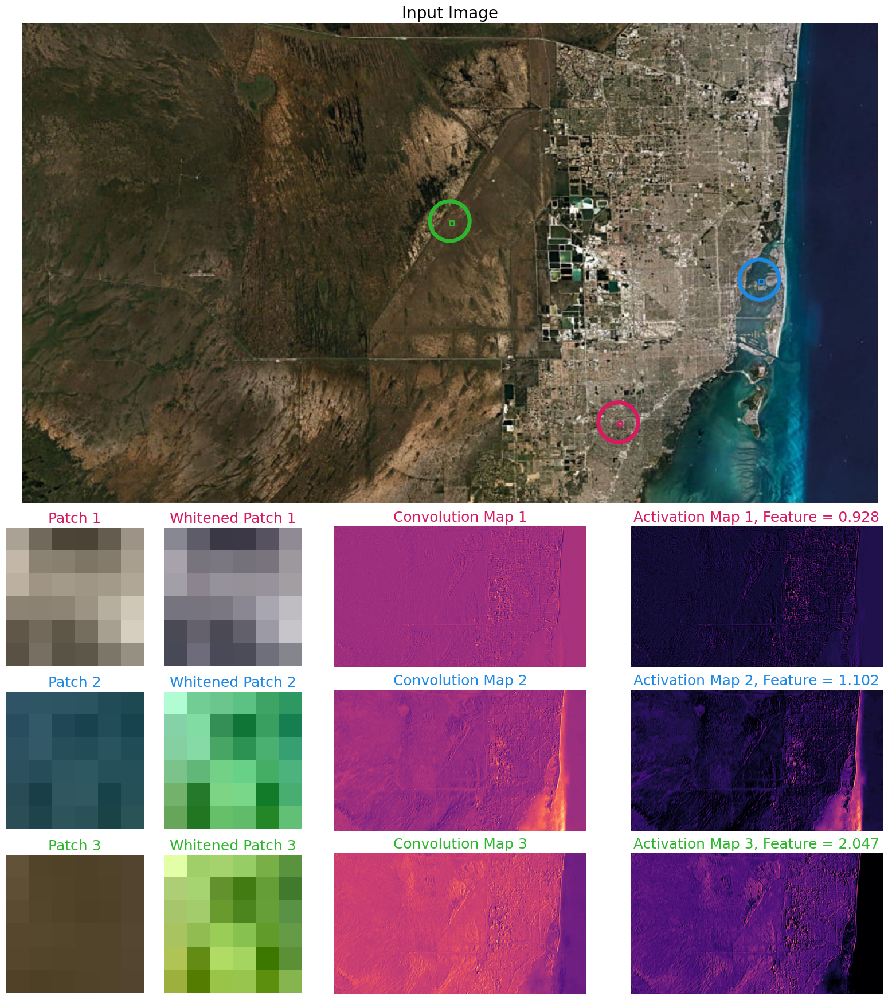

In [6]:
seed = 0
url = (
    "https://cdn.sanity.io/images/hvd5n54p/production/"
    "a332510258992b73c57a72177a391a331c91c951-945x531.jpg?"
    "w=1200&auto=format"
)

# url = "https://media.4-paws.org/c/1/7/8/c178dd618346079f9b96edeacc30563b8de72fb4/Molly_006-2829x1886-2726x1886-1920x1328.webp"

response = requests.get(url)
img = Image.open(BytesIO(response.content)).convert("RGB")

transform = transforms.ToTensor()
img_tensor = transform(img).unsqueeze(0)

# Initialize the model
model = RCFWithPatchSampling(
    num_features=6, patch_sampling=True, seed=seed, kernel_size=6, bias=-1.0
)

# Pass the image through the model
#
x1a, conv_map, feats, un_norm_patches = model(img_tensor)

patch_array = un_norm_patches.cpu().numpy()
patch_coords = model.patch_coords

norm_patch_array = model.weights.cpu().numpy()

# Normalize for display (whitened patches)
min_val = norm_patch_array.min()
max_val = norm_patch_array.max()
if max_val - min_val < 1e-12:
    norm_patch_array = np.zeros_like(norm_patch_array)
else:
    norm_patch_array = (norm_patch_array - min_val) / (max_val - min_val)

# Get the first 3 raw convolution maps and first 3 post-ReLU activation maps
conv_maps = conv_map[0, :3].detach().cpu().numpy()
act_maps = x1a[0, :3].detach().cpu().numpy()

colors = ["#D81B60", "#1E88E5", "#2EB62F"]

###############################################################################
# Create a figure with 4 rows and 4 columns.
# Row 1: Original image (spanning all 4 columns)
# Row 2: Patch 1, Whitened Patch 1, Convolution Map 1, Activation Map 1
# Row 3: Patch 2, Whitened Patch 2, Convolution Map 2, Activation Map 2
# Row 4: Patch 3, Whitened Patch 3, Convolution Map 3, Activation Map 3
###############################################################################
fig = plt.figure(figsize=(20, 22))
gs = gridspec.GridSpec(
    4,
    4,
    height_ratios=[3.75, 1.1, 1.1, 1.1],
    width_ratios=[0.5, 0.5, 1, 1],
    hspace=0.1,
    wspace=0.1,
)

###############################################################################
# Row 1: Original Image (spanning all 4 columns)
###############################################################################
ax0 = fig.add_subplot(gs[0, :])
ax0.imshow(img)
ax0.set_title("Input Image", fontsize=20)
ax0.axis("off")

# Annotate with rectangles where patches are taken
for color, (y, x) in zip(colors, patch_coords):
    rect = mpatches.Rectangle(
        (x, y),
        model.kernel_size,
        model.kernel_size,
        linewidth=2,
        edgecolor=color,
        facecolor="none",
    )
    ax0.add_patch(rect)
    ax0.plot(
        x,
        y,
        marker="o",
        color=color,
        markersize=50,
        markerfacecolor="None",
        markeredgewidth=5,
    )

###############################################################################
# Rows 2-4: Each row has (Patch i, Whitened Patch i, Convolution Map i, Activation Map i)
###############################################################################
for i in range(3):
    # ---- Patch ----
    ax_patch = fig.add_subplot(gs[i + 1, 0])
    patch_img = patch_array[i].transpose(1, 2, 0)  # (C,H,W) -> (H,W,C)
    ax_patch.imshow(patch_img, interpolation="nearest")
    ax_patch.set_title(f"Patch {i + 1}", fontsize=18, color=colors[i])
    ax_patch.axis("off")

    # ---- Whitened Patch ----
    ax_patch_norm = fig.add_subplot(gs[i + 1, 1])
    patch_img_norm = norm_patch_array[i].transpose(1, 2, 0)  # (C,H,W)->(H,W,C)
    ax_patch_norm.imshow(patch_img_norm, interpolation="nearest")
    ax_patch_norm.set_title(f"Whitened Patch {i + 1}", fontsize=18, color=colors[i])
    ax_patch_norm.axis("off")

    # ---- Raw Convolution Map ----
    ax_conv = fig.add_subplot(gs[i + 1, 2])
    ax_conv.imshow(conv_maps[i], cmap="magma")
    ax_conv.set_title(f"Convolution Map {i + 1}", fontsize=18, color=colors[i])
    ax_conv.axis("off")

    # ---- Activation Map (after ReLU) ----
    ax_act = fig.add_subplot(gs[i + 1, 3])
    ax_act.imshow(act_maps[i], cmap="magma")
    ax_act.set_title(
        f"Activation Map {i + 1}, Feature = {feats.cpu().numpy()[i]:.3f}",
        fontsize=18,
        color=colors[i],
    )
    ax_act.axis("off")

plt.show()


## Télécharger les images

Nous allons télécharger le produit d'image visuelle NICFI pour le Togo. Ces fichiers ont été découpés selon la grille MOSAIKS pour plus de simplicité et pour maximiser la vitesse de traitement.

In [4]:
data_dir = "nicfi_data"
os.makedirs(data_dir, exist_ok=True)
file = "clipped_images.zip"
url = f"https://zenodo.org/record/14636097/files/{file}"
local_zip = f"{data_dir}/{file}"
local_dir = local_zip.replace(".zip", "")

In [9]:
if not os.path.exists(local_dir):
    response = requests.get(url)
    with open(local_zip, 'wb') as f:
        f.write(response.content)

    with ZipFile(local_zip, 'r') as zip_ref:
        zip_ref.extractall(data_dir)

    os.remove(local_zip)

for root, dirs, files in os.walk(data_dir):
    for name in files:
        print(os.path.join(root, name))

nicfi_data\clipped_images\lon_-0.005__lat_10.625.tif
nicfi_data\clipped_images\lon_-0.005__lat_10.635.tif
nicfi_data\clipped_images\lon_-0.005__lat_10.645.tif
nicfi_data\clipped_images\lon_-0.005__lat_10.655.tif
nicfi_data\clipped_images\lon_-0.005__lat_10.665.tif
nicfi_data\clipped_images\lon_-0.005__lat_10.675.tif
nicfi_data\clipped_images\lon_-0.005__lat_10.685.tif
nicfi_data\clipped_images\lon_-0.005__lat_10.695.tif
nicfi_data\clipped_images\lon_-0.005__lat_10.705.tif
nicfi_data\clipped_images\lon_-0.005__lat_10.715.tif
nicfi_data\clipped_images\lon_-0.005__lat_10.725.tif
nicfi_data\clipped_images\lon_-0.005__lat_10.735.tif
nicfi_data\clipped_images\lon_-0.005__lat_10.745.tif
nicfi_data\clipped_images\lon_-0.005__lat_10.755.tif
nicfi_data\clipped_images\lon_-0.005__lat_10.765.tif
nicfi_data\clipped_images\lon_-0.005__lat_10.775.tif
nicfi_data\clipped_images\lon_-0.005__lat_10.785.tif
nicfi_data\clipped_images\lon_-0.005__lat_10.795.tif
nicfi_data\clipped_images\lon_-0.005__lat_10.8

In [46]:
def sharpen_image(image: np.ndarray) -> np.ndarray:
    # Define sharpening kernel
    kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

    # Apply kernel to each band if the image has more than 2 dimensions.
    if len(image.shape) == 3:
        sharpened = np.zeros_like(image)
        for i in range(image.shape[2]):
            sharpened[:, :, i] = convolve2d(
                image[:, :, i], kernel, mode="same", boundary="symm"
            )
    else:
        sharpened = convolve2d(image, kernel, mode="same", boundary="symm")

    return np.clip(sharpened, 0, 1)

In [ ]:
seed = 425

np.random.seed(seed)

image_list = os.listdir(local_dir)

image = str(np.random.choice(image_list))
# image = "lon_1.255__lat_8.955.tif"

image_path = os.path.join(local_dir, image)

with rasterio.open(image_path) as src:
    band1 = src.read(1)  # Red
    band2 = src.read(2)  # Green
    band3 = src.read(3)  # Blue

    # Normalize each band independently
    norm_band1 = (band1 - band1.min()) / (band1.max() - band1.min())
    norm_band2 = (band2 - band2.min()) / (band2.max() - band2.min())
    norm_band3 = (band3 - band3.min()) / (band3.max() - band3.min())
    rgb = np.dstack((norm_band1, norm_band2, norm_band3))
    float_rgb = rgb.astype(np.float32)
    rgb_sharpened = sharpen_image(float_rgb)

transform = transforms.ToTensor()
img_tensor = transform(float_rgb).unsqueeze(0)

model = RCFWithPatchSampling(
    num_features=6, patch_sampling=True, seed=seed, kernel_size=4, bias=-1.0
)

# Pass the image through the model
act_pos, conv_map, feats, un_norm_patches = model(img_tensor)

patch_array = un_norm_patches.cpu().numpy()
patch_coords = model.patch_coords

norm_patch_array = model.weights.cpu().numpy()

min_val = norm_patch_array.min()
max_val = norm_patch_array.max()

# Avoid division by zero if the array is constant
if max_val - min_val < 1e-12:
    norm_patch_array = np.zeros_like(norm_patch_array)
else:
    norm_patch_array = (norm_patch_array - min_val) / (max_val - min_val)

act_maps = act_pos[0, :3].detach().cpu().numpy()
colors = ["#2EB62F", "#1E88E5", "#D81B60"]


fig = plt.figure(figsize=(20, 17))
gs = gridspec.GridSpec(
    3, 4,  # 3 rows (one for each patch), 4 columns
    wspace=0.02,
    hspace=0.02,
)

for i in range(3):
    # (a) Input image with only patch i highlighted (column 0)
    ax_img = fig.add_subplot(gs[i, 0])
    ax_img.imshow(rgb_sharpened)
    ax_img.axis("off")
    ax_img.set_title(f"Input Image (Patch {i+1})", fontsize=20, color=colors[i])
    
    # Highlight only this patch i
    y, x = patch_coords[i]
    rect = mpatches.Rectangle(
        (x, y),
        model.kernel_size,
        model.kernel_size,
        linewidth=1.5,
        edgecolor=colors[i],
        facecolor="none",
    )
    ax_img.add_patch(rect)
    ax_img.plot(
        x,
        y,
        marker="o",
        color=colors[i],
        markersize=50,
        markerfacecolor="None",
        markeredgewidth=5,
    )
    
    # (b) Patch i (column 1)
    ax_patch = fig.add_subplot(gs[i, 1])
    patch_img = patch_array[i].transpose(1, 2, 0)  # (C,H,W) -> (H,W,C)
    ax_patch.imshow(patch_img, interpolation="nearest")
    ax_patch.set_title(f"Patch {i+1}", fontsize=20, color=colors[i])
    ax_patch.axis("off")

    # (c) Whitened Patch i (column 2)
    ax_patch_norm = fig.add_subplot(gs[i, 2])
    patch_img_norm = norm_patch_array[i].transpose(1, 2, 0)  # (C,H,W)->(H,W,C)
    ax_patch_norm.imshow(patch_img_norm, interpolation="nearest")
    ax_patch_norm.set_title(f"Whitened Patch {i+1}", fontsize=20, color=colors[i])
    ax_patch_norm.axis("off")

    # (d) Activation Map i (column 3)
    ax_act = fig.add_subplot(gs[i, 3])
    ax_act.imshow(act_maps[i], cmap="magma")
    ax_act.set_title(f"Activation Map {i+1}", fontsize=20, color=colors[i])
    ax_act.axis("off")

plt.show()

## Définir un ensemble de données PyTorch

Cette classe `VisualBasemapDataset` définit comment nous chargeons, transformons et redimensionnons nos images selon les besoins. Cet ensemble de données sera transmis à notre PyTorch DataLoader défini plus tard.

In [50]:
class VisualBasemapDataset(Dataset):
    """
    A custom Dataset that loads and transforms .tif images from specified directories.

    Specifically, it:

    - Loads only the first three bands (RGB).
    - Normalizes the pixel values by dividing by 255.
    - Optionally resizes the images to a specified size.
    - Includes metadata: 'unique_id' and 'basemap_id'.

    Parameters
    ----------
    root_dir : str
        Root directory containing multiple 'global_quarterly_*_mosaic' subdirectories.
    transform : callable, optional
        Optional transform to be applied on a sample.
    resize : tuple of int, optional
        Desired output size as (height, width). If None, no resizing is applied.
    specific_dir : str, optional
        If provided, only load images from this directory under root_dir.
    verbosity : int, optional
        Level of verbosity. Default is 0 (silent). Set to 1 to enable print statements.

    """

    def __init__(
        self,
        root_dir: str,
        transform: Optional[Callable] = None,
        resize: Optional[Tuple[int, int]] = None,
        specific_dir: Optional[str] = None,
        verbosity: int = 0,
    ):
        self.root_dir = root_dir
        self.transform = transform
        self.resize = resize
        self.specific_dir = specific_dir
        self.verbosity = verbosity
        self.image_paths = self._gather_image_paths()

    def _gather_image_paths(self) -> List[str]:
        """
        Collects paths to all .tif files.

        If `specific_dir` is provided, only loads images from that directory.
        Otherwise, traverses the root directory and collects paths to all .tif files within subdirectories.

        Returns
        -------
        List[str]
            List of file paths to .tif images.

        Raises
        ------
        ValueError
            If the specified directory does not exist.

        """
        image_paths = []

        if self.specific_dir:
            # Use specific_dir
            dir_to_search = os.path.join(self.root_dir, self.specific_dir)
            if os.path.isdir(dir_to_search):
                for file_name in os.listdir(dir_to_search):
                    if file_name.lower().endswith(".tif"):
                        full_path = os.path.join(dir_to_search, file_name)
                        image_paths.append(full_path)
            else:
                raise ValueError(
                    f"Specified directory '{dir_to_search}' does not exist"
                )
        else:
            # Search over subdirectories as before
            for mosaic_dir in os.listdir(self.root_dir):
                mosaic_path = os.path.join(self.root_dir, mosaic_dir)
                if (
                    os.path.isdir(mosaic_path)
                    and mosaic_dir.startswith("global_quarterly")
                    and mosaic_dir.endswith("_mosaic")
                ):
                    for file_name in os.listdir(mosaic_path):
                        if file_name.lower().endswith(".tif"):
                            full_path = os.path.join(mosaic_path, file_name)
                            image_paths.append(full_path)

        if self.verbosity > 0:
            print(f"Total images found: {len(image_paths)}")

        return image_paths

    def __len__(self) -> int:
        """
        Returns the total number of images in the dataset.

        Returns
        -------
        int
            The length of the dataset.

        """
        return len(self.image_paths)

    def __getitem__(self, idx: int) -> Dict[str, Any]:
        """
        Loads and returns the transformed image and its metadata at the specified index.

        Parameters
        ----------
        idx : int
            Index of the image to retrieve.

        Returns
        -------
        Dict[str, Any]
            A dictionary containing:
                - 'image': Normalized (and optionally resized) image tensor.
                - 'basemap_id': Name of the basemap directory.
                - 'unique_id': Image file name without the '.tif' extension.

        Raises
        ------
        IndexError
            If the index is out of bounds.

        """
        if idx < 0 or idx >= len(self.image_paths):
            raise IndexError("Index out of bounds")

        img_path = self.image_paths[idx]

        # **1. Extract Metadata**
        # Extract 'unique_id' from file name (without extension)
        file_name = os.path.basename(img_path)
        unique_id, _ = os.path.splitext(file_name)

        # Extract 'basemap_id' from the parent directory name
        basemap_id = os.path.basename(os.path.dirname(img_path))

        # **2. Read Only the First Three Bands (RGB)**
        with rasterio.open(img_path) as src:
            rgb_bands = src.read([1, 2, 3])  # Bands are 1-indexed in rasterio

            # **3. Convert to Float32 and Normalize**
            rgb_bands = rgb_bands.astype(np.float32) / 255.0  # Normalize to [0, 1]

        # **4. Apply Optional Transformations**
        if self.transform:
            rgb_bands = self.transform(rgb_bands)

        # **5. Convert to PyTorch Tensor**
        # Current shape: (C, H, W) -> Desired shape: (C, H, W) as Tensor
        image_tensor = torch.from_numpy(rgb_bands)

        # **6. Apply Optional Resizing**
        if self.resize:
            # torch.nn.functional.interpolate (F) expects input of shape (N, C, H, W)
            # Add batch dimension, perform interpolation, then remove batch dimension
            image_tensor = F.interpolate(
                image_tensor.unsqueeze(0),
                size=self.resize,
                mode="bilinear",
                align_corners=False,
            ).squeeze(0)

        # **7. Prepare the Sample Dictionary**
        sample = {
            "image": image_tensor,  # Shape: (3, H, W)
            "basemap_id": basemap_id,  # String
            "unique_id": unique_id,  # String
        }

        return sample

### Utilisation de TorchGeo

La bibliothèque Python `torchgeo` fournit une classe appelée `RCF` ([définition du code ici](https://github.com/microsoft/torchgeo/blob/main/torchgeo/models/rcf.py)). La classe `RCF` est une définition de modèle PyTorch pré-construite spécifiquement pour extraire des features convolutionnelles aléatoires à partir d'images satellite. L'un des principaux avantages de l'utilisation de `torchgeo` est qu'elle fournit une interface simple et facile à utiliser tout en permettant un échantillonnage aléatoire ou empirique des poids.

In [ ]:
local_dir

In [ ]:
num_features = 4000
mode = "empirical"
kernel_size = 4
bias = -1.0
seed = 42
bands = [1, 2, 3]
resize = (234, 234)


dataset = VisualBasemapDataset(
    root_dir="nicfi_data",
    specific_dir="clipped_images",
    resize=resize,
)
len(dataset)

In [55]:
from torchgeo.models import RCF

model_kwargs = {
    "in_channels": len(bands),
    "features": num_features,
    "kernel_size": kernel_size,
    "bias": bias,
    "seed": seed,
    "mode": mode,
    "dataset": dataset if mode == "empirical" else None,
}
model = RCF(**model_kwargs)

In [ ]:
model.get_buffer("weights").shape

In [ ]:
model.get_buffer("biases")

In [ ]:
model.weights[:1]

In [ ]:
torch.cuda.is_available()

In [62]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# model_fn = f"{mode}_rcf_{num_features}_{kernel_size}_{bias}_{seed}.pt"
# model_fp = os.path.join(local_dir, model_fn)

# model = torch.jit.load(model_fp)

model = model.eval().to(device)

In [ ]:
batch_size = 100

dataloader = DataLoader(
    dataset,
    batch_size=batch_size,
    shuffle=False,
    collate_fn=lambda x: x,
    num_workers=os.cpu_count() * 2,
)

In [ ]:
unique_ids = []
basemap_ids = []
x_all = np.zeros((len(dataset), num_features), dtype=float)
i = 0
tic = time.time()

for batch in dataloader:
    for image in batch:
        if i % 1000 == 0:
            print(
                (
                    f"{i:,}/{len(dataset):,} -- "
                    f"{i / len(dataset) * 100:0.2f}% -- "
                    f"{time.time() - tic:0.2f} seconds"
                )
            )
            tic = time.time()

        image_tensor = image["image"]
        unique_id = image["unique_id"]
        basemap_id = image["basemap_id"]

        image_tensor = image_tensor.to(device)

        with torch.no_grad():
            feats = model(image_tensor).cpu().numpy()

        x_all[i] = feats
        unique_ids.append(unique_id)
        basemap_ids.append(basemap_id)

        i += 1

## Monter le lecteur Google Drive

Maintenant que nous avons terminé le processus de caractérisation, nous devons monter le lecteur pour enregistrer les résultats si vous utilisez Google Colab.

In [ ]:
features_df = pd.DataFrame(x_all, index=unique_ids)
features_df = features_df.add_prefix("planet_").reset_index()
features_df.rename(columns={"index": "unique_id"}, inplace=True)
features_df["basemap_id"] = basemap_ids


In [ ]:
if not ON_COLAB:
    features_fn = "features.parquet"
    features_df.to_parquet(features_fn, index=False)

In [ ]:
save_to_drive = True

if save_to_drive and ON_COLAB:
    from google.colab import drive

    drive_dir = "/content/drive"

    drive.mount(drive_dir)

    drive_directory = os.path.join(
        drive_dir,
        "MyDrive",
        "Colab Notebooks",
        "Data",
    )
    os.makedirs(drive_directory, exist_ok=True)

    features_fn = "features.feather"
    features_fp = os.path.join(drive_directory, "features", features_fn)

    print(f"Saving {features_fn}")

    features_df.to_parquet(features_fp, index=False)

In [ ]:
# First split on double underscore to separate lat and lon parts
features_df[["lat_part", "lon_part"]] = features_df["unique_id"].str.split(
    "__", expand=True
)

# Extract the numerical values and convert dashes to decimal points
features_df["lat"] = (
    features_df["lat_part"].str.replace("lat_", "").str.replace("--", ".").astype(float)
)
features_df["lon"] = (
    features_df["lon_part"].str.replace("lon_", "").str.replace("--", ".").astype(float)
)

# Drop intermediate columns if you don't need them
features_df = features_df.drop(["lat_part", "lon_part"], axis=1)
features_df

In [ ]:
features_df

In [ ]:
gdf = gpd.GeoDataFrame(
    features_df, geometry=gpd.points_from_xy(features_df.lon, features_df.lat)
)

# Buffer the points with square cap style
# cap_style=3 gives square corners
gdf["geometry"] = gdf.geometry.buffer(0.005, cap_style=3)

In [ ]:
# Plot the first column (planet_0)
fig, ax = plt.subplots(figsize=(10, 10))
gdf.plot(column="planet_0", ax=ax, legend=True)
plt.title("Planet 0 Values")
plt.show()